In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingRegressor, VotingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:

# 데이터 불러오기
file_path = 'insurance.csv'
insurance_data = pd.read_csv(file_path)

# 특성과 타겟 분리, 타겟에 로그 변환 적용
X = insurance_data.drop('charges', axis=1)
y = np.log1p(insurance_data['charges'])  # log1p로 안전하게 로그 변환

# 상호작용 및 다항식 특성 추가
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X[['age', 'bmi', 'children']])
X_poly_df = pd.DataFrame(X_poly, columns=poly.get_feature_names_out(['age', 'bmi', 'children']))

# 범주형 변수와 수치형 변수를 결합하여 최종 데이터 준비
X = pd.concat([X.drop(['age', 'bmi', 'children'], axis=1), X_poly_df], axis=1)
X = pd.get_dummies(X, drop_first=True)  # 범주형 변수 인코딩

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 컬럼 변환기 정의
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), X_poly_df.columns.tolist())  # 숫자형 특성 스케일링
    ], remainder='passthrough')  # 이미 더미 인코딩된 범주형 변수 유지

In [3]:

# 각 모델에 대해 파이프라인 생성
pipeline_gb = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor(random_state=42))
])

pipeline_xgb = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(random_state=42, objective='reg:squarederror'))
])

pipeline_lgb = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LGBMRegressor(random_state=42))
])

pipeline_cat = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', CatBoostRegressor(random_state=42, verbose=0))
])

# 파라미터 그리드 설정 (세밀한 탐색)
param_grid_gb = {
    'regressor__n_estimators': [200, 300, 400],
    'regressor__learning_rate': [0.01, 0.03, 0.05],
    'regressor__max_depth': [3, 4, 5],
    'regressor__min_samples_split': [5, 10],
    'regressor__min_samples_leaf': [2, 4]
}

param_grid_xgb = {
    'regressor__n_estimators': [200, 300, 400],
    'regressor__learning_rate': [0.01, 0.03, 0.05],
    'regressor__max_depth': [3, 4, 5],
    'regressor__subsample': [0.8, 0.9]
}

param_grid_lgb = {
    'regressor__n_estimators': [200, 300, 400],
    'regressor__learning_rate': [0.01, 0.03, 0.05],
    'regressor__max_depth': [3, 4, 5],
    'regressor__num_leaves': [20, 30, 40],
    'regressor__subsample': [0.8, 0.9]
}

param_grid_cat = {
    'regressor__iterations': [200, 300, 400],
    'regressor__learning_rate': [0.01, 0.03, 0.05],
    'regressor__depth': [3, 4, 5]
}

# 각 모델에 대해 Grid Search 실행
grid_search_gb = GridSearchCV(pipeline_gb, param_grid_gb, cv=KFold(n_splits=5, shuffle=True, random_state=42), scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search_xgb = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=KFold(n_splits=5, shuffle=True, random_state=42), scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search_lgb = GridSearchCV(pipeline_lgb, param_grid_lgb, cv=KFold(n_splits=5, shuffle=True, random_state=42), scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search_cat = GridSearchCV(pipeline_cat, param_grid_cat, cv=KFold(n_splits=5, shuffle=True, random_state=42), scoring='neg_mean_absolute_error', n_jobs=-1)

grid_search_gb.fit(X_train, y_train)
grid_search_xgb.fit(X_train, y_train)
grid_search_lgb.fit(X_train, y_train)
grid_search_cat.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1139
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1139
[LightGBM] [Info] Number of data points in the train set: 856, number of used features: 14
[LightGBM] [Info] Number of data points in the train set: 856, number of used features: 14[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008131 seconds.
You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Total Bins 1139
[LightGBM] [Info] Number of data points in the train set: 856, number of used features: 14
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002019 seconds.
You can set `force_row_wise=true` t

/Users/sin-yeho/DeepL/myenv/lib/python3.11/site-packages/sklearn/compose/_column_transformer.py:1623: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['age',
                                                                          'bmi',
                                                                          'children',
                                                                          'age^2',
                                                                          'age '
                                                                          'bmi',
                                                                          'age '
                                                                          'children',
                                                                          'bmi^2',
                                                                          'bmi '
                                                                          'children',
                                                                          'children^2'])])),
                                       ('regressor',
                                        <catboost.core.CatBoostRegressor object at 0x133a82910>)]),
             n_jobs=-1,
             param_grid={'regressor__depth': [3, 4, 5],
                         'regressor__iterations': [200, 300, 400],
                         'regressor__learning_rate': [0.01, 0.03, 0.05]},
             scoring='neg_mean_absolute_error')

In [4]:
# 최적 모델 추출
best_gb_model = grid_search_gb.best_estimator_
best_xgb_model = grid_search_xgb.best_estimator_
best_lgb_model = grid_search_lgb.best_estimator_
best_cat_model = grid_search_cat.best_estimator_

# VotingRegressor로 앙상블 모델 생성
ensemble_model = VotingRegressor([('gb', best_gb_model), ('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)])
ensemble_model.fit(X_train, y_train)

# 예측 및 로그 변환 복원
y_pred_log = ensemble_model.predict(X_test)
y_pred = np.expm1(y_pred_log)  # 로그 변환 복원
y_test_original = np.expm1(y_test)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1190
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 14
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Mean Absolute Error (MAE): 1936.8832870709139
Mean Squared Error (MSE): 18500069.854905434
Root Mean Squared Error (RMSE): 4301.170753981459
R-squared (R²): 0.8808359354879126


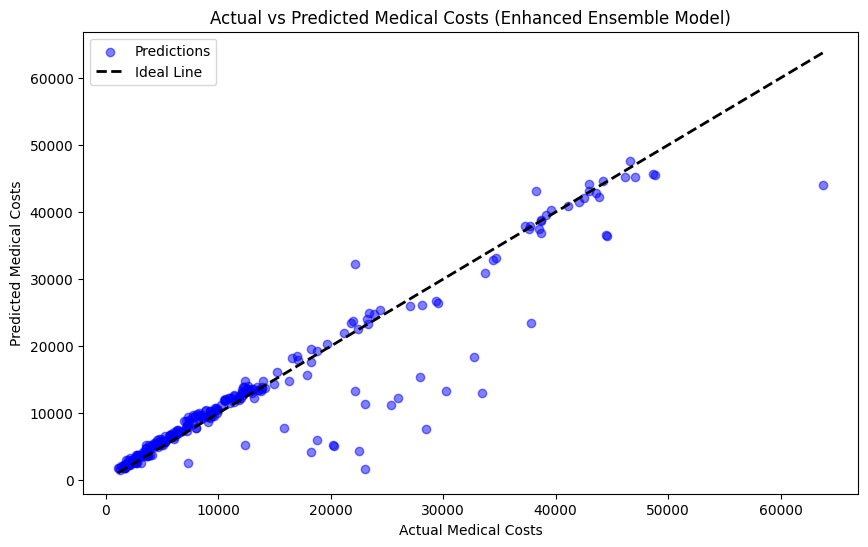

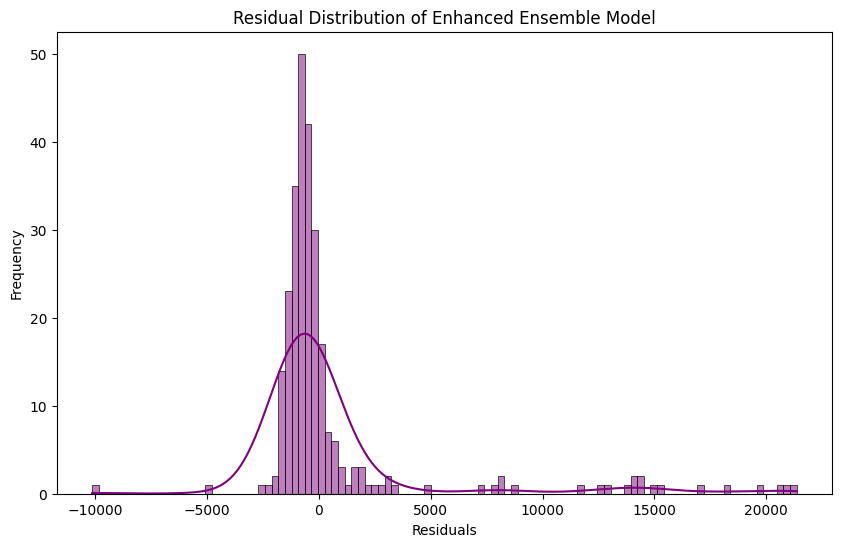

In [5]:

# 평가 지표 계산
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R²):", r2)

# 실제 값과 예측 값 시각화
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, color="blue", alpha=0.5, label="Predictions")
plt.plot([y_test_original.min(), y_test_original.max()], [y_test_original.min(), y_test_original.max()], 'k--', lw=2, label="Ideal Line")
plt.xlabel("Actual Medical Costs")
plt.ylabel("Predicted Medical Costs")
plt.title("Actual vs Predicted Medical Costs (Enhanced Ensemble Model)")
plt.legend()
plt.show()

# 잔차 시각화
residuals = y_test_original - y_pred
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color="purple", alpha=0.5)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Residual Distribution of Enhanced Ensemble Model")
plt.show()
